In [2]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.keras.layers import Embedding, Bidirectional, Flatten, Dense, GlobalAveragePooling1D, Conv1D, LSTM, GRU
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
% matplotlib inline

UsageError: Line magic function `%` not found.


In [3]:
columns = ['target', 'id', 'date', 'flag', 'user', 'text']
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', names=columns, encoding='latin-1')
df

,target,id,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
...,...,...,...,...,...,...
1599995,4,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,Just woke up. Having no school is the best fee...
1599996,4,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,TheWDB.com - Very cool to hear old Walt interv...
1599997,4,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,Are you ready for your MoJo Makeover? Ask me f...
1599998,4,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,Happy 38th Birthday to my boo of alll time!!! ...


In [4]:
le = LabelEncoder()
df['target'] = le.fit_transform(df['target'])
X = df['text']
Y = df['target']
Y = to_categorical(Y, 3)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=4)

In [5]:
vocab = 100000
embedding_dim = 64
oov_token = '<OOV>'
pad_type = 'post'
trunc_type = 'post'
maxlen = 64

In [6]:
tokenizer = Tokenizer(num_words=vocab, oov_token=oov_token)
tokenizer.fit_on_texts(X_train)
train_sequences = tokenizer.texts_to_sequences(X_train)
train_final = pad_sequences(train_sequences, padding=pad_type, truncating=trunc_type, maxlen=maxlen)

test_sequences = tokenizer.texts_to_sequences(X_test)
test_final = pad_sequences(test_sequences, padding=pad_type, truncating=trunc_type, maxlen=maxlen)

In [7]:
model = tf.keras.Sequential([Embedding(vocab, embedding_dim, input_length=64),
                             Bidirectional(GRU(64)),
                             Dense(64, activation='relu'),
                             Dense(3, activation='softmax')
                             ]
                            )

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 64, 64)            6400000   
_________________________________________________________________
bidirectional (Bidirectional (None, 128)               49920     
_________________________________________________________________
dense (Dense)                (None, 64)                8256      
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 195       
Total params: 6,458,371
Trainable params: 6,458,371
Non-trainable params: 0
_________________________________________________________________


In [9]:
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy']
              )

In [11]:
history = model.fit(train_final, Y_train, epochs=10)

Epoch 1/10
40000/40000 [==============================] - 398s 10ms/step - loss: 0.3929 - accuracy: 0.8217

Text(0.5, 1.0, 'Acuracy Vs Epochs')

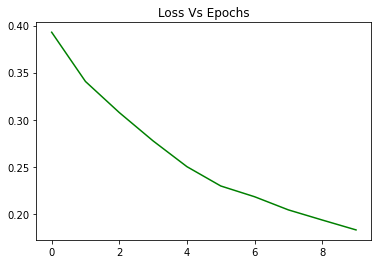

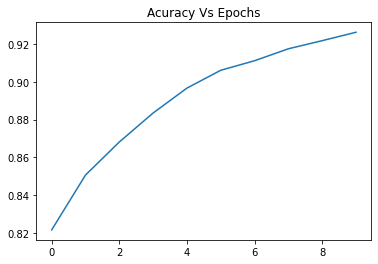

In [18]:
loss = history.history['loss']
acc = history.history['accuracy']
plt.figure()
plt.plot(loss, color='g')
plt.title('Loss Vs Epochs')
plt.figure()
plt.plot(acc)
plt.title('Acuracy Vs Epochs')

In [19]:
model.evaluate(test_final, Y_test)

10000/10000 [==============================] - 47s 5ms/step - loss: 0.5334 - accuracy: 0.8021

[0.5334107875823975, 0.8020874857902527]